In [1]:
%load_ext autoreload
%autoreload 3

In [2]:
import pandas as pd
from bamboo.data_manager import DataManager
from bamboo.conventions import Conventions
import seaborn as sns
import matplotlib.pyplot as plt

import darts as ds

sns.set(context="paper", palette="colorblind")


In [3]:
data_manager = DataManager()

In [4]:
data_manager.cities

array(['sj', 'iq'], dtype=object)

In [5]:
data_manager.describe_features()

,count,mean,std,min,25%,50%,75%,max
year,1456.0,2001.031593,5.408314,1990.000000,1997.000000,2002.000000,2005.000000,2010.000000
weekofyear,1456.0,26.503434,15.019437,1.000000,13.750000,26.500000,39.250000,53.000000
ndvi_ne,1262.0,0.142294,0.140531,-0.406250,0.044950,0.128817,0.248483,0.508357
ndvi_nw,1404.0,0.130553,0.119999,-0.456100,0.049217,0.121429,0.216600,0.454429
ndvi_se,1434.0,0.203783,0.073860,-0.015533,0.155087,0.196050,0.248846,0.538314
ndvi_sw,1434.0,0.202305,0.083903,-0.063457,0.144209,0.189450,0.246982,0.546017
precipitation_amt_mm,1443.0,45.760388,43.715537,0.000000,9.800000,38.340000,70.235000,390.600000
reanalysis_air_temp_k,1446.0,298.701852,1.362420,294.635714,297.658929,298.646429,299.833571,302.200000
reanalysis_avg_temp_k,1446.0,299.225578,1.261715,294.892857,298.257143,299.289286,300.207143,302.928571
reanalysis_dew_point_temp_k,1446.0,295.246356,1.527810,289.642857,294.118929,295.640714,296.460000,298.450000


In [6]:
data_manager.describe_labels()

,count,mean,std,min,25%,50%,75%,max
year,1456.0,2001.031593,5.408314,1990.0,1997.00,2002.0,2005.00,2010.0
weekofyear,1456.0,26.503434,15.019437,1.0,13.75,26.5,39.25,53.0
total_cases,1456.0,24.675137,43.596000,0.0,5.00,12.0,28.00,461.0


In [7]:
data_sj = data_manager.get_city_training_data("sj")
data_iq = data_manager.get_city_training_data("iq")

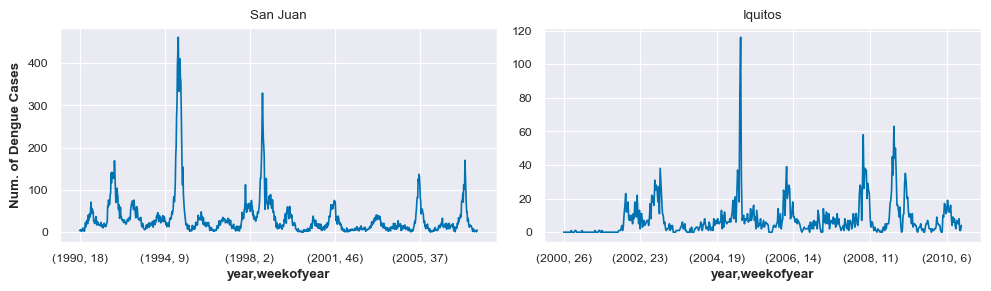

In [8]:
fig, (ax_sj, ax_iq) = plt.subplots(ncols=2, figsize=(10,3))

data_sj.set_index(Conventions.INDICES)[Conventions.TARGET].plot(ax=ax_sj)
data_iq.set_index(Conventions.INDICES)[Conventions.TARGET].plot(ax=ax_iq)

ax_sj.set(title="San Juan", ylabel="Num. of Dengue Cases")
ax_iq.set(title="Iquitos")
plt.tight_layout()

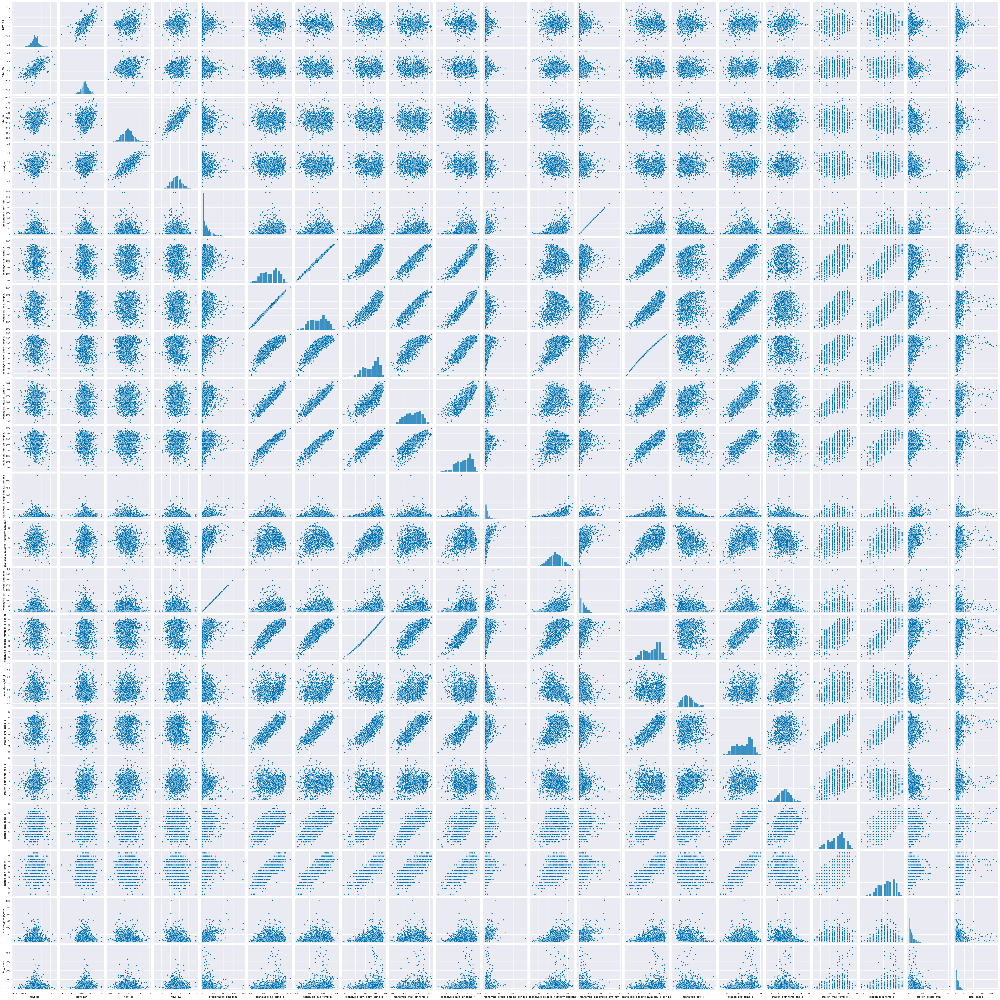

In [14]:
sns.pairplot(data_sj.drop(
    columns=[
        Conventions.CITY,
        Conventions.WEEK_START_DATE,
        Conventions.WEEKOFYEAR,
        Conventions.YEAR,
    ]
))


In [39]:
features_no_dates = data_sj.drop(
    columns=[
        Conventions.CITY,
        Conventions.WEEK_START_DATE,
        Conventions.WEEKOFYEAR,
        Conventions.YEAR,
    ]
)


These columns are highly correlated.

In [40]:
COLS_TO_REMOVE = [
    "precipitation_amt_mm",
    "reanalysis_air_temp_k",
    "reanalysis_dew_point_temp_k",
]
features_no_dates = features_no_dates.drop(columns=COLS_TO_REMOVE)


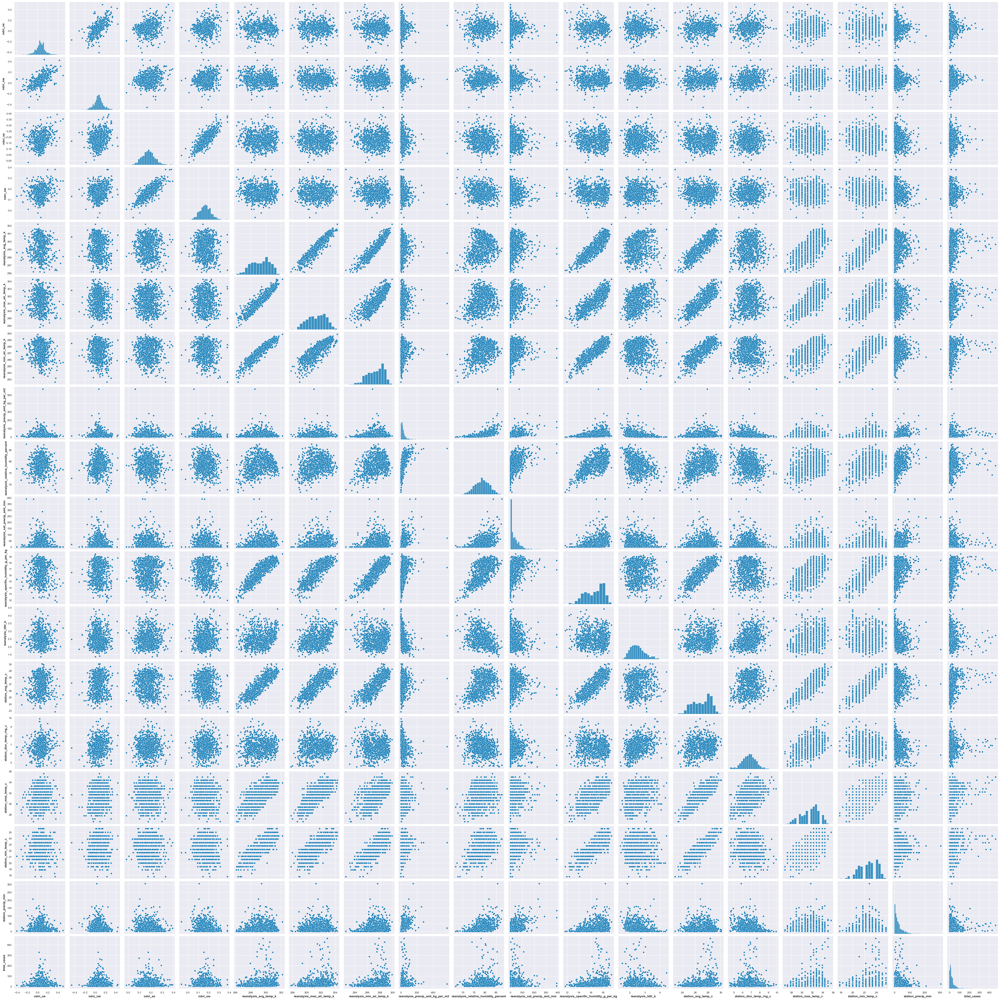

In [41]:
sns.pairplot(features_no_dates)

In [42]:
from bamboo.engineering import shift_feature

In [63]:
peek_shift = shift_feature(
    col="reanalysis_min_air_temp_k",
    data=features_no_dates[["reanalysis_min_air_temp_k", Conventions.TARGET]],
    shifts=[2,4,6,8,10,15,20]
)


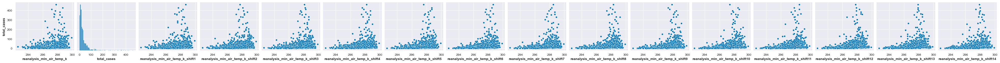

In [56]:
sns.pairplot(peek_shift, y_vars=Conventions.TARGET)

<AxesSubplot: >

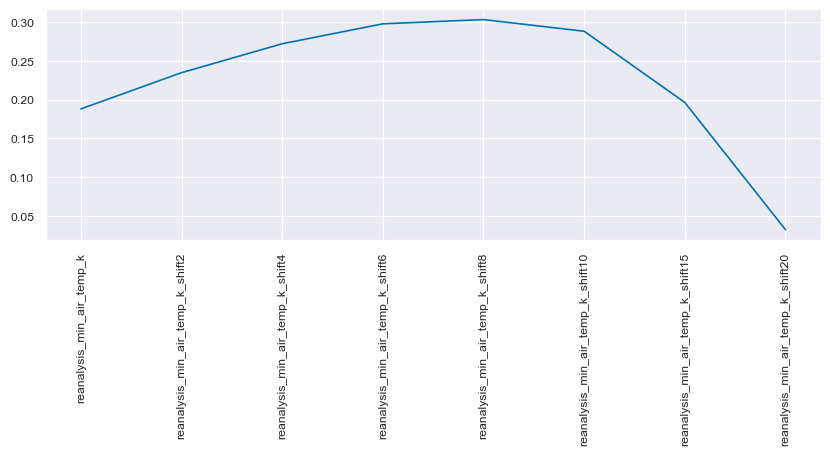

In [65]:
peek_shift.corr()[Conventions.TARGET].drop(Conventions.TARGET).plot(rot=90, figsize=(10, 3))

Aha! We can increase the correlation when we take information from the past.

# Darts Model (dirty)

In [ ]:
target_sj = data_sj[Conventions.TARGET]
target_sj.index = pd.RangeIndex(start=target_sj.index[0], stop=target_sj.index[-1] + 1)

features_sj = data_sj.drop(
    [
        Conventions.CITY,
        Conventions.TARGET,
        "year",
        Conventions.WEEK_START_DATE,
        Conventions.WEEKOFYEAR,
    ],
    axis=1,
)
features_sj.index = pd.RangeIndex(start=features_sj.index[0], stop=features_sj.index[-1] + 1)

In [ ]:
features_sj.index

In [ ]:
target_sj.index

In [ ]:
target_ds = ds.TimeSeries.from_series(target_sj)
features_ds = ds.TimeSeries.from_dataframe(features_sj)

In [ ]:
from darts.utils.model_selection import train_test_split
from darts.models import RandomForest, ExponentialSmoothing
from darts.metrics import mape, mae
from darts.dataprocessing.transformers import Scaler, MissingValuesFiller, missing_values_filler
from darts.utils.missing_values import missing_values_ratio, fill_missing_values

In [ ]:
missing_values_ratio(features_ds)

In [ ]:
features_ds = fill_missing_values(features_ds)

In [ ]:
missing_values_ratio(features_ds)

In [ ]:
scaler_target = Scaler(name="target")
scaler_features = Scaler(name="features")

In [ ]:
target_ds_scaled = scaler_target.fit_transform(target_ds)
features_ds_scaled = scaler_features.fit_transform(features_ds)

In [ ]:
training_target, test_target = train_test_split(target_ds_scaled, test_size=0.2)
training_feat, test_feat = train_test_split(features_ds_scaled, test_size=0.2)

In [ ]:
model = RandomForest(lags=2, lags_past_covariates=4*6, n_estimators=500, max_depth=20)
model.fit(series=training_target, past_covariates=features_ds_scaled)
prediction = model.predict(len(test_feat), num_samples=1)
target_ds_scaled.plot()
prediction.plot()


In [ ]:
parameters = dict(
    lags=[2, 4, 8, 10, 20],
    lags_past_covariates=[2, 4, 4 * 2, 4 * 3, 4 * 4, 4 * 12],
    n_estimators=[100, 500],
    max_depth=[5, 100],
)
best_model = RandomForest.gridsearch(
    parameters=parameters,
    start=0.5,
    series=training_target,
    forecast_horizon=4,
    past_covariates=features_ds_scaled,
    metric=mae,
    n_jobs=1,
)
best_model.fit(series=training_target, past_covariates=features_ds_scaled)
prediction = model.predict(len(test_feat), num_samples=1)
target_ds_scaled.plot()
prediction.plot()
